# Community Detection - Lab

## Introduction

In this lab, you'll once again work to cluster a network dataset. This time, you'll be investigating a meetup dataset for events occurring in Nashville.

## Objectives

You will be able to:
- Cluster a social network into subgroups

## Load the Dataset

To start, load the dataset `'nashville-meetup/group-edges.csv'` as a pandas Dataframe. 

In [1]:
#Your code here
import pandas as pd
df = pd.read_csv('nashville-meetup/group-edges.csv')
df.head()

,Unnamed: 0,group1,group2,weight
0,0,19292162,535553,2
1,1,19292162,19194894,1
2,2,19292162,19728145,1
3,3,19292162,18850080,2
4,4,19292162,1728035,1


To add some descriptive data, import the file `'nashville-meetup/meta-groups.csv'`.

In [2]:
#Your code here
meta = pd.read_csv('nashville-meetup/meta-groups.csv')
meta.head()

,group_id,group_name,num_members,category_id,category_name,organizer_id,group_urlname
0,339011,Nashville Hiking Meetup,15838,23,Outdoors & Adventure,4353803,nashville-hiking
1,19728145,Stepping Out Social Dance Meetup,1778,5,Dancing,118484462,steppingoutsocialdance
2,6335372,Nashville soccer,2869,32,Sports & Recreation,108448302,Nashville-soccer
3,10016242,NashJS,1975,34,Tech,8111102,nashjs
4,21174496,20's & 30's Women looking for girlfriends,2782,31,Socializing,184580248,new-friends-in-Nashville


## Transform to a Network Representation

Take the Pandas DataFrame and transform it into a graph representation via NetworkX. Make nodes the names of the various groups within the Nashville area. The edges should be the weights between these groups.

In [3]:
#Your code here
import networkx as nx
group_dict = dict(zip(meta['group_id'], meta['group_name']))
G = nx.Graph()
for row in df.index:
    g1 = group_dict[df['group1'][row]]
    g2 = group_dict[df['group2'][row]]
    weight = df['weight'][row]
    G.add_edge(g1, g2, weight=weight)

## Visualize the Network

/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


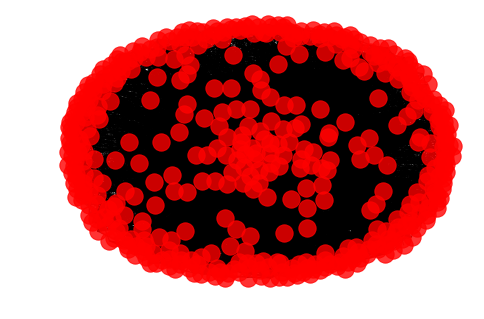

In [4]:
#Your code here
import matplotlib.pyplot as plt
%matplotlib inline

nx.draw(G, pos=nx.spring_layout(G, k=2, seed=5),
        alpha=0.8)

## Refine the Visual

As you should see, the initial visualization is a globular mess! Refine the visualization to better picture the center core of the  network.

In [5]:
#Your code here
for i in range(0,100,5):
    print('{}th percentiole: {}'.format(i, df['weight'].quantile(q=i/100)))

0th percentiole: 1.0
5th percentiole: 1.0
10th percentiole: 1.0
15th percentiole: 1.0
20th percentiole: 1.0
25th percentiole: 1.0
30th percentiole: 1.0
35th percentiole: 1.0
40th percentiole: 1.0
45th percentiole: 1.0
50th percentiole: 1.0
55th percentiole: 1.0
60th percentiole: 1.0
65th percentiole: 1.0
70th percentiole: 2.0
75th percentiole: 2.0
80th percentiole: 2.0
85th percentiole: 3.0
90th percentiole: 4.0
95th percentiole: 7.0


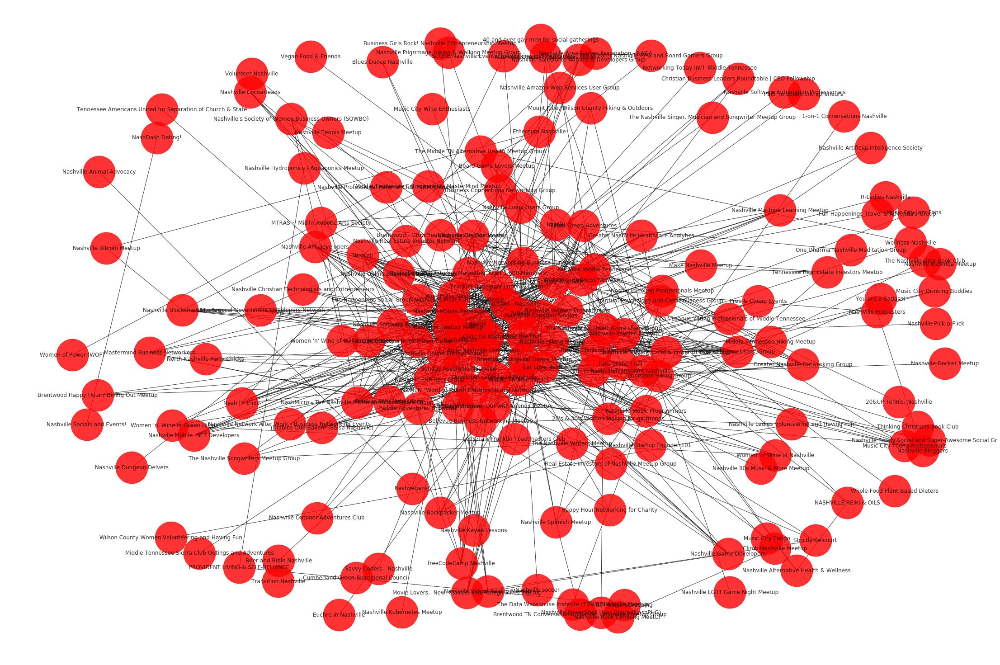

In [8]:
#Your code here
thresh = 5
G_subset = nx.Graph()
for row in df.index:
    g1 = group_dict[df['group1'][row]]
    g2 = group_dict[df['group2'][row]]
    weight = df['weight'][row]
    if weight >= thresh:
        G_subset.add_edge(g1, g2, weight=weight)
        
plt.figure(figsize=(30,20))        
nx.draw(G_subset, pos=nx.spring_layout(G, k=2, seed=5),
        alpha=0.8, with_labels=True, font_size=12, node_size=5000)

In [9]:
len(G_subset)

175

## Try Clustering the Network

Now, that the dataset is a little more manageable, try clustering the remaining group nodes.

In [10]:
gn_clusters = list(nx.algorithms.community.centrality.girvan_newman(G_subset))
for n, clusters in enumerate(gn_clusters):
    print('removing {} edges: {} clusters'.format(n, len(clusters)))

removing 0 edges: 8 clusters
removing 1 edges: 9 clusters
removing 2 edges: 10 clusters
removing 3 edges: 11 clusters
removing 4 edges: 12 clusters
removing 5 edges: 13 clusters
removing 6 edges: 14 clusters
removing 7 edges: 15 clusters
removing 8 edges: 16 clusters
removing 9 edges: 17 clusters
removing 10 edges: 18 clusters
removing 11 edges: 19 clusters
removing 12 edges: 20 clusters
removing 13 edges: 21 clusters
removing 14 edges: 22 clusters
removing 15 edges: 23 clusters
removing 16 edges: 24 clusters
removing 17 edges: 25 clusters
removing 18 edges: 26 clusters
removing 19 edges: 27 clusters
removing 20 edges: 28 clusters
removing 21 edges: 29 clusters
removing 22 edges: 30 clusters
removing 23 edges: 31 clusters
removing 24 edges: 32 clusters
removing 25 edges: 33 clusters
removing 26 edges: 34 clusters
removing 27 edges: 35 clusters
removing 28 edges: 36 clusters
removing 29 edges: 37 clusters
removing 30 edges: 38 clusters
removing 31 edges: 39 clusters
removing 32 edges: 4

## Determine An Optimal Clustering Schema

Finally, determine a final clustering organization.

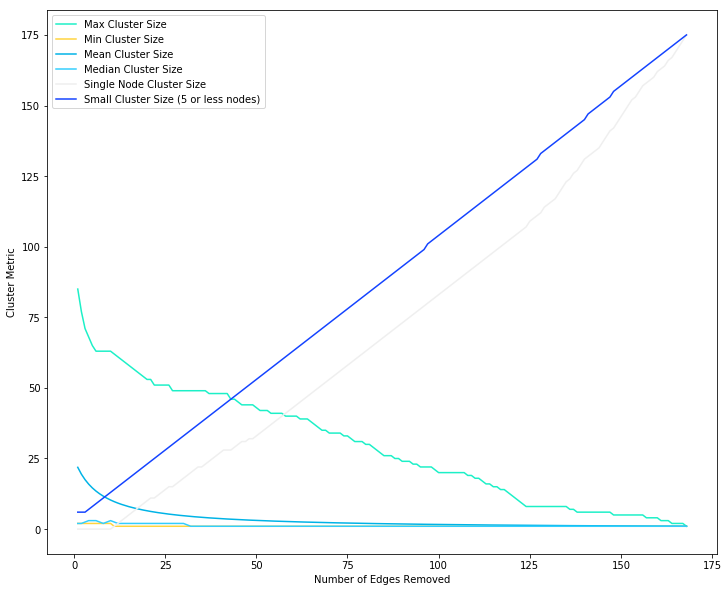

In [14]:
#Your code here
import numpy as np
colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
          "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99",
          "#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99",
          "#b15928","#8dd3c7","#ffffb3","#bebada","#fb8072","#80b1d3",
          "#fdb462","#b3de69","#fccde5","#d9d9d9","#bc80bd","#ccebc5",
          "#ffed6f","#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
          "#80cdc1", "#35978f", "#01665e", "#003c30"]

fig = plt.figure(figsize=(12,10))
x = [n+1 for n in range(len(gn_clusters))]

max_cluster_size = [max([len(c) for c in cluster]) for cluster in gn_clusters]
min_cluster_size = [min([len(c) for c in cluster]) for cluster in gn_clusters]
mean_cluster_size = [np.mean([len(c) for c in cluster]) for cluster in gn_clusters]
median_cluster_size = [np.median([len(c) for c in cluster]) for cluster in gn_clusters]
single_node_cluster_size = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in gn_clusters]
small_cluster_size = [sum([1 if len(c)<=5 else 0 for c in cluster]) for cluster in gn_clusters]

plt.plot(x, max_cluster_size, color=colors[0], label='Max Cluster Size')
plt.plot(x, min_cluster_size, color=colors[1], label='Min Cluster Size')
plt.plot(x, mean_cluster_size, color=colors[2], label='Mean Cluster Size')
plt.plot(x, median_cluster_size, color=colors[3], label='Median Cluster Size')
plt.plot(x, single_node_cluster_size, color=colors[4], label='Single Node Cluster Size')
plt.plot(x, small_cluster_size, color=colors[5], label='Small Cluster Size (5 or less nodes)')

plt.legend()
plt.xlabel('Number of Edges Removed')
plt.ylabel('Cluster Metric')
plt.show()

## Visualize the Clusters

Analyze the output of your clustering schema. Do any clusters of groups stand out to you?

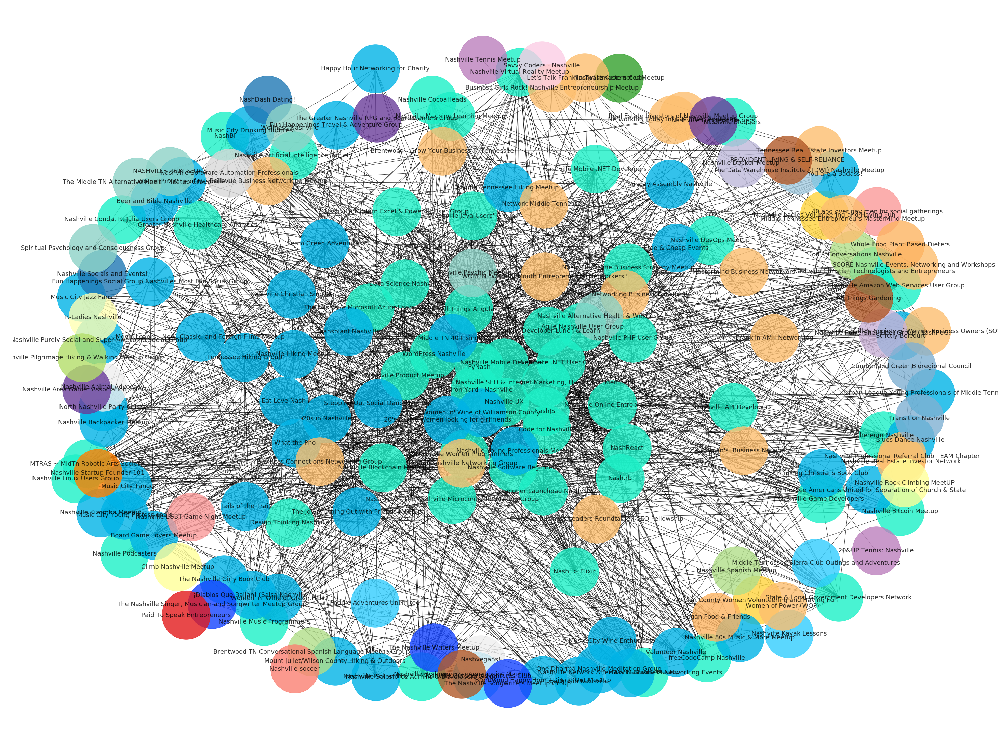

In [21]:
#Your code here
plt.figure(figsize=(40,30))   
for n, c in enumerate(gn_clusters[20]):
    ci = G.subgraph(c)
    nx.draw(ci, pos=nx.spring_layout(G_subset, k=2, seed=3),
        alpha=0.8, node_color=colors[n],
        with_labels=True, font_size=18, node_size=20000)
plt.show()

In [25]:
clusters = pd.DataFrame(gn_clusters[20]).transpose()
clusters.columns = ['Cluster{}'.format(i) for i in range(1,len(clusters.columns)+1)]
clusters

,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,Cluster10,...,Cluster19,Cluster20,Cluster21,Cluster22,Cluster23,Cluster24,Cluster25,Cluster26,Cluster27,Cluster28
0,Nashville Mobile .NET Developers,Nashville Ladies Volunteering and Having Fun,Brentwood Happy Hour / Dining Out Meetup,Nashville Outdoor Adventures Club,Nashville Animal Advocacy,"The Nashville Singer, Musician and Songwriter ...",The Data Warehouse Institute (TDWI) Nashville ...,NashDash Dating!,1-on-1 Conversations Nashville,Nashville Kubernetes Meetup,...,Nashville Psychic Meetup,R-Ladies Nashville,Nashville Docker Meetup,Nashville soccer,Cumberland Green Bioregional Council,Vegan Food & Friends,Nashville Pilgrimage Hiking & Walking Meetup G...,Savvy Coders - Nashville,Nashville Software Automation Professionals,20&UP Tennis: Nashville
1,NashMicro - The Nashville Microcontroller Make...,Wilson County Women Volunteering and Having Fun,What the Pho!,Nashville Kayak Lessons,Nashvegans!,The Nashville Songwriters Meetup Group,None,Nashville Socials and Events!,Brentwood TN Conversational Spanish Language M...,None,...,Wellness Nashville,None,None,None,Transition Nashville,Whole-Food Plant-Based Dieters,None,None,None,Nashville Tennis Meetup
2,Make Nashville Meetup,None,North Nashville Party Chicks,Paddle Adventures Unlimited,None,The Nashville Writers Meetup,None,None,Nashville Spanish Meetup,None,...,Spiritual Psychology and Consciousness Group,None,None,None,None,None,None,None,None,None
3,Developer Launchpad Nashville,None,Nashville Backpacker Meetup,Middle Tennessee Sierra Club Outings and Adven...,None,None,None,None,None,None,...,The Middle TN Alternative Health Meetup Group,None,None,None,None,None,None,None,None,None
4,Nashville Blockchain Meetup,None,Music City Young Professionals,None,None,None,None,None,None,None,...,NASHVILLE REIKI & OILS,None,None,None,None,None,None,None,None,None
5,"Nashville SEO & Internet Marketing, Over 1,600...",None,20s in Nashville,None,None,None,None,None,None,None,...,Nashville Alternative Health & Wellness,None,None,None,None,None,None,None,None,None
6,freeCodeCamp Nashville,None,Euchre in Nashville,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
7,Nashville DevOps Meetup,None,One Dharma Nashville Meditation Group,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
8,The Nashville Microsoft Azure Users Group,None,The Joy of Dining Out with Friends Meetup,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
9,Design Thinking Nashville,None,Music City Wine Enthusiasts,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


## Summary

In this lab, you got another chance to practice your network clustering skills, investigating a meetup dataset of events and groups surrounding the Nashville area. If you're up for the challenge, feel free to continue investigating the dataset and trying to cluster users or events!                                                                                                                                                               